#Assignment 1, discrete diffusion process simulation

I will also use some Python core packages thoughout the examples such as time since want to benchmark how well each solution performs

##Timer definition:

In [1]:
import time

class Timer:
    def __enter__(self):
        self.start = time.time()
        return self

    def __exit__(self, *args):
        self.end = time.time()
        self.interval = self.end - self.start

##Q1: Basic Python interpreter

*Packages used:*

In [2]:
import numpy as np

In [3]:
def diffusion(N, num_steps):
    un = np.random.randn(N+2, N+2)
        
    for step in range(num_steps):
        un = diffusion_iteration(un)


def diffusion_iteration(un):
    """
    Perform one diffusion step for all given grid points.

    Parameters
    ----------
    un : numpy.ndarray
        Numpy array of type `float64` and dimension (N + 2, N + 2) that stores the
        function values at step n.

    This function returns a Numpy array of dimension (N + 2, N + 2) of type `float64`
    that contains the function values after performing one step of the above diffusion
    iteration.
    """
    # un needs to be read-only
    copy = un.copy()
    for i in range(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            copy[i, j] = (un[i, j+1] + un[i+1, j] +
                          un[i-1, j] + un[i, j-1]) / 4

    return copy

with Timer() as t:
    diffusion(360,50)
print("Time to run q1_parameters: {0}".format(t.interval))

Time to run q1_parameters: 10.456823348999023


 The results seem to be quite slow. The reason is that we have three nested for-loops.The first loop, which is O(n) will call the set of nested loops, which is O(N²) for each diffusion step. The overall complexity should be around O(N² * n). On each diffusion process, a copy of the current grid is made so we don't overwrite the values of the current matrix. If we do, this would impact the values of its next neigboors which would still be on the same step.
 
Python is an interpreted language, so it usually not as fast as compiled languages. Python's interpreter has to translate these inner instructions on the fly, i.e. every time they happen instead of pre-compiling the instructions to machine code

##Q2.a: Basic Numba compilation

*Packages used:*

In [4]:
import numpy as np
from numba import njit

In [5]:
@njit
def diffusion(N, num_steps):    
    un = np.random.randn(N+2, N+2)

    for step in range(num_steps):
        un = diffusion_iteration(un)

@njit
def diffusion_iteration(un):   
    copy = un.copy()
    for i in range(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            copy[i, j] = (un[i, j+1] + un[i+1, j] +
                          un[i-1, j] + un[i, j-1]) / 4

    return copy


with Timer() as t:
    diffusion(360,50)
print("Time to run q1_parameters: {0}".format(t.interval))

with Timer() as t:
    diffusion(6500,15)
print("Time to run q2_parameters: {0}".format(t.interval))


Time to run q1_parameters: 0.6349887847900391
Time to run q2_parameters: 6.165085792541504


Numba allows us to use a JIT compiler that translates a subset of Python interpreter code to compiled machine code.
By doing that, there is a noticeable performance improvement. The same code as Q1, with the same parameters, run around 20 times quicker

##Q2.b: Numba compilation with parallelisation

*Packages used:*

In [6]:
import numpy as np
from numba import njit, prange, typeof

In [7]:
@njit(parallel=True)
def diffusion(N, num_steps):
    un = np.random.randn(N+2, N+2)

    for step in range(num_steps):
        un = diffusion_iteration(un)


@njit(parallel=True)
def diffusion_iteration(un):
    copy = un.copy()
    for i in prange(1, len(un) - 1): #process matrix lines in parallel
        for j in range(1, len(un[0]) - 1):
            copy[i, j] = (un[i, j+1] + un[i+1, j] +
                          un[i-1, j] + un[i, j-1]) / 4

    return copy


with Timer() as t:
    diffusion(360, 50)
print("Time to run q1_parameters: {0}".format(t.interval))

with Timer() as t:
    diffusion(6500, 15)
print("Time to run q2_parameters: {0}".format(t.interval))

Time to run q1_parameters: 1.3310425281524658
Time to run q2_parameters: 4.696186780929565


This parallelised execution was run on a I7-7700HQ processor, with 4 cores and 8 threads available.

I have not parallelised the most outer for-loop. This loop applies a diffusion process at step n for matrix Un. Since Un+1 is computed based on the diffused matrix of Un, steps have to be processed sequentially. What I did parallelise was the processing of the matrix rows, so the diffusion process on each step is going to be executed using multiple threads. The theoretical speed-up should be around 8 times quicker on my machine if the code was run completely in parallel but as stated before, some parts had to run serially to produce the right output.

Running `Q1 parameters` in parallel actually took longer than the previous version. That happens because the matrix size is not sufficiently large. The Kernel takes more time to initialise and schedule new threads to run the computation than if we just computed them using the current runtime thread

For `Q2 parameters` the time taken to run was around 18% quicker using `prange` to parallelise the code compared to the previous version. It tends to perform even quicker when using larger matrices since the parallel execution will run for more time on each step, reducing the global time when compared to the single-thread execution.

##Q3: Visualisation of a discrete diffusion process on a grid

*Packages used:*

In [8]:
import numpy as np
import matplotlib
import time
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation
from numba import njit, prange
import matplotlib.patches as mpatches

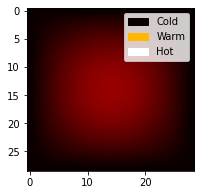

In [9]:
im = None
N = 27
un = np.array(0)
fps = 30
animation_duration = 10  # sec


@njit(parallel=True)
def diffusion_iteration(un):
    copy = un.copy()
    for i in prange(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            copy[i, j] = (un[i, j+1] + un[i+1, j] +
                          un[i-1, j] + un[i, j-1]) / 4

    return copy


def animate_func(i):
    global un, im
    #perform one diffusion process each frame
    un = diffusion_iteration(un)
    im.set_array(un)
    return [im]


def init_grid():
    global un, im
    # grid with zeros at the boundaries
    un = np.zeros((N+2, N+2))
    middle = (len(un) - 1) / 2
    step = 0.3
    for i in range(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            sum = step
            if j == middle or i == middle:
                sum += step/step**2
            #apply different scores depending on the i,j
            un[i, j] = np.random.uniform(low=sum, high=sum + 0.4)

    im = plt.imshow(un, cmap='hot', interpolation='sinc',
                    aspect='auto', vmin=0, vmax=1)
    #set legends to the animation
    colors = [im.cmap(im.norm(np.min(un))), im.cmap(
        im.norm(np.mean(un))), im.cmap(im.norm(np.max(un)))]
    patches = [mpatches.Patch(color=colors[0], label="Cold"), mpatches.Patch(
        color=colors[1], label="Warm"), mpatches.Patch(
        color=colors[2], label="Hot")]
    plt.legend(handles=patches)
    return [im]


anim = animation.FuncAnimation(
    plt.figure(figsize=(3, 3)),
    animate_func,
    init_func=init_grid,
    frames=animation_duration * fps,
    interval=1000 / fps,  # ms
    blit=True
)

HTML(anim.to_jshtml())

The chosen distribuition colours were arranged based on the following:

- When Un[i,j] is 1 or greater, its pixel is displayed as hot (close to white)
- When Un[i,j] is 0, its pixel displayed as cold (black)
- When Un[i,j] is around 0.5, its pixel displayed as warm (orange)

The initial grid is set to have its boundaries as zero (cold). Each matrix row or column lying in the middle of the grid will have its value to be hot, variating from from 3.63 to 4.03. The remaining points will be warm, variating from 0.3 to 0.7.





##Advanced Problem¶

*Packages used:*

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from numba import njit, prange, typeof
from numba.core import types
from numba.typed import Dict

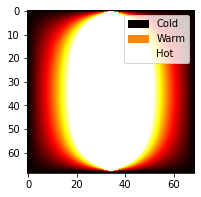

In [11]:
im = None
un = np.array(0)
N = 67
fps = 30
animation_duration = 10  # secs
#hashable dictionaries
constant_indices = Dict.empty(key_type=types.Tuple(
    (types.int64, types.int64)), value_type=types.boolean)


@ njit(parallel=True)
def diffusion_iteration(un, constant_indices):
    copy = un.copy()
    for i in prange(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            #do not diffuse if index is contant
            if (i, j) not in constant_indices:
                copy[i, j] = (un[i, j+1] + un[i+1, j] +
                              un[i-1, j] + un[i, j-1]) / 4

    return copy


def animate_func(i):
    global un, im, constant_indices
    #perform one diffusion process each frame
    un = diffusion_iteration(un, constant_indices)
    im.set_array(un)
    return [im]


def init_grid():
    global un, im, constant_indices
    # grid with zeros at the boundaries
    un = np.zeros((N+2, N+2))
    
    middle = (len(un) - 1) / 2
    step = 0.3
    for i in range(1, len(un) - 1):
        for j in range(1, len(un[0]) - 1):
            sum = step
            if j == middle or i == middle:
                sum += step/step**2
            if j == middle:
                # the Y-axis of the grid will be constant
                constant_indices[(i, j)] = True
                
            #apply different scores depending on the i,j
            un[i, j] = np.random.uniform(low=sum, high=sum + 0.4)

    im = plt.imshow(un, cmap='hot', interpolation='sinc',
                    aspect='auto', vmin=0, vmax=1)
    #set colour legend
    colors = [im.cmap(im.norm(np.min(un))), im.cmap(
        im.norm(np.mean(un))), im.cmap(im.norm(np.max(un)))]
    patches = [mpatches.Patch(color=colors[0], label="Cold"), mpatches.Patch(
        color=colors[1], label="Warm"), mpatches.Patch(
        color=colors[2], label="Hot")]
    plt.legend(handles=patches)
    return [im]


anim = animation.FuncAnimation(
    plt.figure(figsize=(3, 3)),
    animate_func,
    init_func=init_grid,
    frames=animation_duration * fps,
    interval=1000 / fps,  # ms
    blit=True
)

HTML(anim.to_jshtml())

The distribution is the same as above. The difference here is that all hot pixels initially set when the matrix column(Y-axis)  is in the middle, are now constants. That makes higher values being propagated to the boundaries, i.e. the grid gets hotter over time whereas in the previous example the grid got colder.

The data structures I originally used was a Python set. So I could store the matrix rows and columns using its native hash function, mapping the keys to the location in memory. However, the set type is getting deprecated for future Numba versions as it is declared here https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

So to not have any warning in the code, I did what is suggested in the documentation. I am using a typed.Dict, which is designed to perform quicker using explicit types.  The key of my dictionary is a tuple of two integers: The row and the column of the grid that I want to keep the value as constant. Tuples are fast and hashable since they are immutable when not storing complex objects. That allows their memory allocation to be in a single block. Moreover, if I had a bigger data set of constant values, I could use NumPy to perform binary search since I am creating these indices in a sorted order through the matrix dimensions and also no duplicated values would happen.